# 准备环境

In [1]:
import os
os.chdir('mmdetection')

# 准备数据集

In [ ]:
# 解压文件夹（直接就是COCO格式）
# unzip Drink_284_Detection_coco.zip
# rm -rf __MACOSX

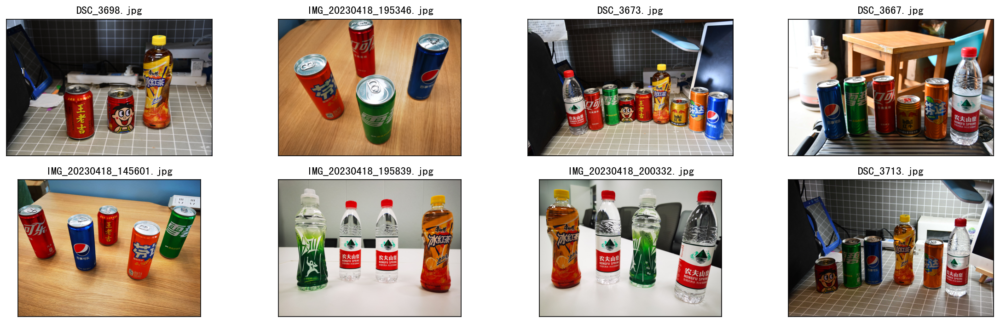

In [3]:
# 数据集可视化
import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

data_path = '/root/autodl-tmp/MMDet/Drink_284_Detection_coco/images'
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_paths= [filename for filename in os.listdir(data_path)][:8]


for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]
    image = Image.open(data_path+'/'+filename).convert("RGB")
  
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


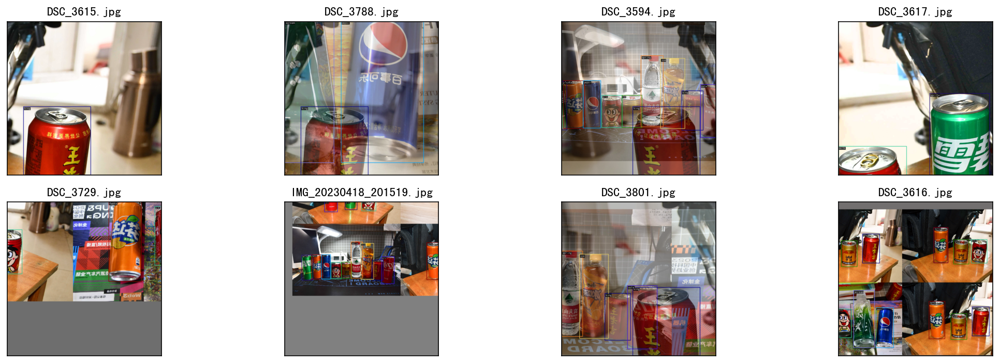

In [6]:
# 训练前可视化验证
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope
import os
import matplotlib.pyplot as plt
import os.path as osp    # 需要添加这句才能运行

cfg = Config.fromfile('data/rtmdet_tiny_1xb12-40e_drink.py')

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

# 只可视化前 8 张图片
for i in range(8):
   item=dataset[i]

   img = item['inputs'].permute(1, 2, 0).numpy()
   data_sample = item['data_samples'].numpy()
   gt_instances = data_sample.gt_instances
   img_path = osp.basename(item['data_samples'].img_path)

   gt_bboxes = gt_instances.get('bboxes', None)
   gt_instances.bboxes = gt_bboxes.tensor
   data_sample.gt_instances = gt_instances

   visualizer.add_datasample(
            osp.basename(img_path),
            img,
            data_sample,
            draw_pred=False,
            show=False)
   drawed_image=visualizer.get_image()

   plt.subplot(2, 4, i+1)
   plt.imshow(drawed_image[..., [2, 1, 0]])
   plt.title(f"{osp.basename(img_path)}")
   plt.xticks([])
   plt.yticks([])

plt.tight_layout()    

# 训练

In [ ]:
# 训练
# python tools/train.py data/rtmdet_tiny_1xb12-40e_drink.py

# 测试

In [8]:
# 模型测试
!python tools/test.py data/rtmdet_tiny_1xb12-40e_drink.py work_dirs/rtmdet_tiny_1xb12-40e_drink/best_coco/bbox_mAP_epoch_40.pth --show-dir results

06/11 22:01:19 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
    CUDA available: True
    numpy_random_seed: 1389279541
    GPU 0: NVIDIA GeForce RTX 3090
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.1, V11.1.105
    GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
    PyTorch: 1.9.0+cu111
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.1
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-genco

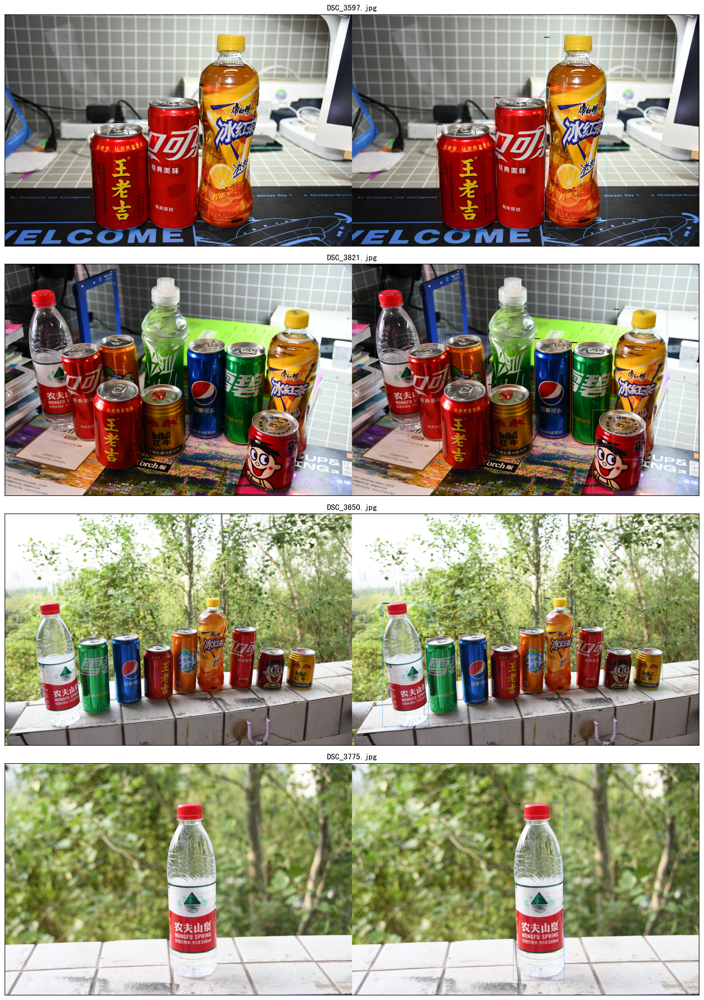

In [9]:
# 测试集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

plt.figure(figsize=(20, 20))

# 你如果重新跑，这个时间戳是不一样的，需要自己修改
root_path='work_dirs/rtmdet_tiny_1xb12-40e_drink/20230611_220118/results/'
image_paths= [filename for filename in os.listdir(root_path)][:4]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open(root_path+filename).convert("RGB")
  
    plt.subplot(4, 1, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

In [18]:
# 测试图片
!python demo/image_demo.py data/test_drink/cola.jpg data/rtmdet_tiny_1xb12-40e_drink.py --weights work_dirs/rtmdet_tiny_1xb12-40e_drink/best_coco/bbox_mAP_epoch_40.pth --out-dir results

Loads checkpoint by local backend from path: work_dirs/rtmdet_tiny_1xb12-40e_drink/best_coco/bbox_mAP_epoch_40.pth
06/11 22:29:47 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
06/11 22:29:47 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
06/11 22:29:50 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
06/11 22:29:50 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/root/miniconda3/lib/python3.8/site-packages/torch/nn/functional.py:718: 0m━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   
f

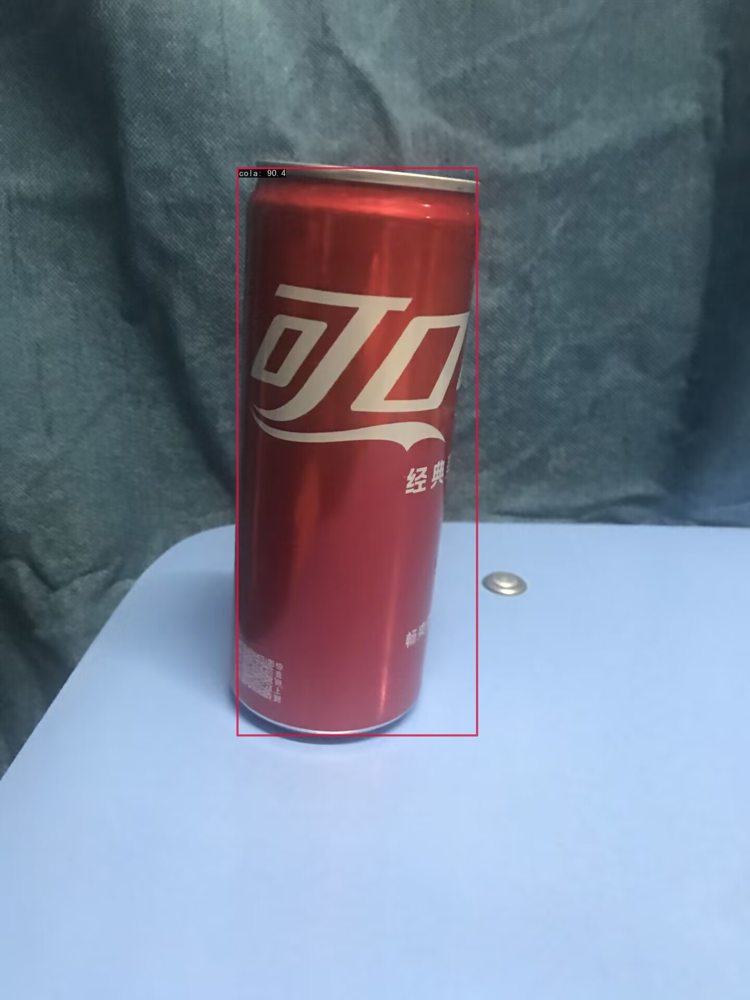

In [19]:
Image.open('results/vis/cola.jpg')